# cognifyz intern data analysis level one task

## Import Datasets and display the data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
import folium
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from collections import Counter
ds = pd.read_csv("cognifyz_datasets.csv")

ds.head(9)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
5,18189371,Din Tai Fung,162,Mandaluyong City,"Ground Floor, Mega Fashion Hall, SM Megamall, ...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056314,14.583764,Chinese,...,Botswana Pula(P),No,No,No,No,3,4.4,Green,Very Good,336
6,6300781,Buffet 101,162,Pasay City,"Building K, SM By The Bay, Sunset Boulevard, M...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979667,14.531333,"Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.0,Green,Very Good,520
7,6301290,Vikings,162,Pasay City,"Building B, By The Bay, Seaside Boulevard, Mal...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979333,14.540000,"Seafood, Filipino, Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.2,Green,Very Good,677
8,6300010,Spiral - Sofitel Philippine Plaza Manila,162,Pasay City,"Plaza Level, Sofitel Philippine Plaza Manila, ...","Sofitel Philippine Plaza Manila, Pasay City","Sofitel Philippine Plaza Manila, Pasay City, P...",120.980090,14.552990,"European, Asian, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.9,Dark Green,Excellent,621


In [2]:
ds.shape

(9551, 21)

In [3]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [4]:
ds.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

# Level 1

## Task 1: Top Cuisines

In [5]:
cuisine_counts = ds['Cuisines'].str.split(', ', expand=True).stack().value_counts()
top_cuisines = cuisine_counts.head(3)
total_restaurants = len(ds)
percentage_per_cuisine = (top_cuisines / total_restaurants) * 100

print("Top three most common cuisines:")
print(top_cuisines)
print("\nPercentage of restaurants serving each of the top cuisines:")
print(percentage_per_cuisine)

Top three most common cuisines:
North Indian    3960
Chinese         2735
Fast Food       1986
Name: count, dtype: int64

Percentage of restaurants serving each of the top cuisines:
North Indian    41.461627
Chinese         28.635745
Fast Food       20.793634
Name: count, dtype: float64


## Task 2: City Analysis

In [6]:
city_restaurant_counts = ds['City'].value_counts()
city_with_most_restaurants = city_restaurant_counts.idxmax()
city_avg_ratings = ds.groupby('City')['Aggregate rating'].mean()
city_with_highest_avg_rating = city_avg_ratings.idxmax()
highest_avg_rating = city_avg_ratings.max()

print("City with the highest number of restaurants:", city_with_most_restaurants)
print("\nAverage rating for restaurants in each city:")
for city, avg_rating in city_avg_ratings.items():
    print(f"{city}: {avg_rating:.2f}")
print("\nCity with the highest average rating:", city_with_highest_avg_rating)
print("Highest average rating:", highest_avg_rating)

City with the highest number of restaurants: New Delhi

Average rating for restaurants in each city:
Abu Dhabi: 4.30
Agra: 3.96
Ahmedabad: 4.16
Albany: 3.55
Allahabad: 3.40
Amritsar: 3.69
Ankara: 4.30
Armidale: 3.50
Athens: 4.20
Auckland: 4.28
Augusta: 4.13
Aurangabad: 3.38
Balingup: 3.20
Bandung: 4.20
Bangalore: 4.38
Beechworth: 4.60
Bhopal: 3.95
Bhubaneshwar: 3.98
Birmingham: 3.68
Bogor: 3.85
Boise: 4.26
Bras�_lia: 3.50
Cape Town: 4.11
Cedar Rapids/Iowa City: 4.17
Chandigarh: 4.05
Chatham-Kent: 3.70
Chennai: 4.31
Clatskanie: 4.30
Cochrane: 3.10
Coimbatore: 4.13
Colombo: 3.87
Columbus: 4.03
Consort: 3.00
Dalton: 4.11
Davenport: 3.71
Dehradun: 4.05
Des Moines: 4.24
Dicky Beach: 3.60
Doha: 4.06
Dubai: 4.37
Dubuque: 3.54
East Ballina: 4.10
Edinburgh: 4.09
Faridabad: 1.87
Fernley: 3.70
Flaxton: 3.50
Forrest: 3.70
Gainesville: 4.04
Ghaziabad: 2.85
Goa: 4.25
Gurgaon: 2.65
Guwahati: 4.19
Hepburn Springs: 3.80
Huskisson: 4.10
Hyderabad: 4.34
Indore: 3.97
Inner City: 4.90
Inverloch: 3.70
Jaipu

## Task 3: Price Range Distribution

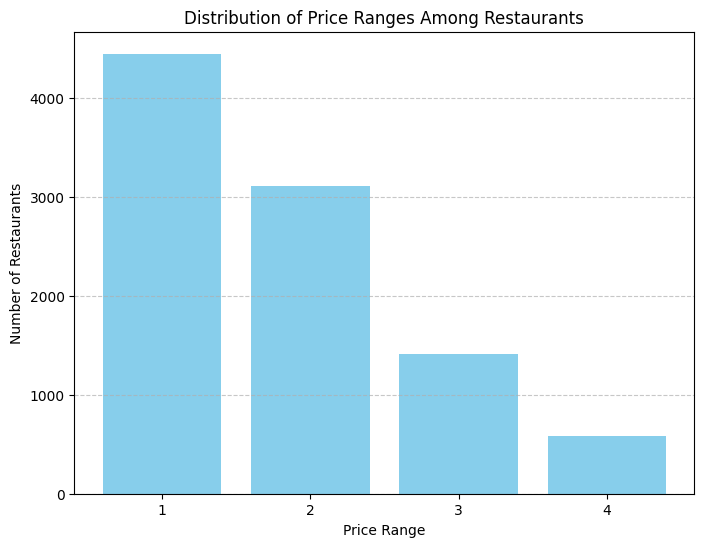

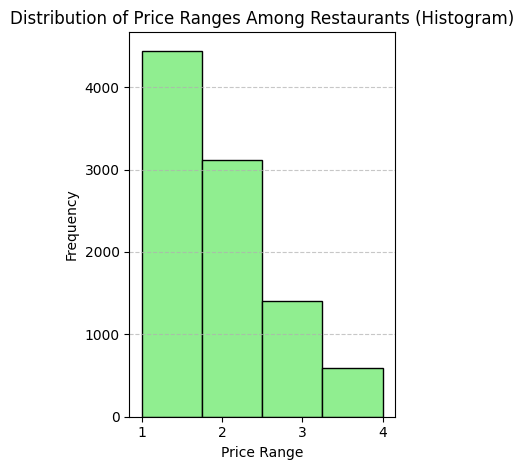

Percentage of restaurants in each price range category:
Price range
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: count, dtype: float64


In [7]:
price_range_counts = ds['Price range'].value_counts()
total_restaurants = len(ds)
percentage_per_price_range = (price_range_counts / total_restaurants) * 100

#Bar graph
plt.figure(figsize=(8, 6))
plt.bar(price_range_counts.index, price_range_counts.values, color='skyblue')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Price Ranges Among Restaurants')
plt.xticks(price_range_counts.index)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()
#Histogram Graph
plt.subplot(1, 2, 2)
plt.hist(ds['Price range'], bins=len(price_range_counts), color='lightgreen', edgecolor='black')
plt.xlabel('Price Range')
plt.ylabel('Frequency')
plt.title('Distribution of Price Ranges Among Restaurants (Histogram)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()
print("Percentage of restaurants in each price range category:")
print(percentage_per_price_range)

## Task 4: Online Delivery

In [8]:
le=preprocessing.LabelEncoder()
ds['Has Online delivery']=le.fit_transform(ds['Has Online delivery'])
ds.head(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,0,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,0,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,0,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,0,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,0,No,No,4,4.8,Dark Green,Excellent,229


In [9]:
total_restaurants = len(ds)
restaurants_with_online_delivery = ds['Has Online delivery'].sum()
percentage_with_online_delivery = (restaurants_with_online_delivery / total_restaurants) * 100
average_rating_with_delivery = ds[ds['Has Online delivery'] == 1]['Aggregate rating'].mean()
average_rating_without_delivery = ds[ds['Has Online delivery'] == 0]['Aggregate rating'].mean()

print("Percentage of restaurants that offer online delivery:", percentage_with_online_delivery)
print("Average rating of restaurants with online delivery:", average_rating_with_delivery)
print("Average rating of restaurants without online delivery:", average_rating_without_delivery)

Percentage of restaurants that offer online delivery: 25.662234321013504
Average rating of restaurants with online delivery: 3.2488372093023257
Average rating of restaurants without online delivery: 2.465295774647887


# Level 2

## Task 1: Restaurant Ratings

In [10]:
rating_counts = ds['Aggregate rating'].value_counts().sort_index()
most_common_rating = rating_counts.idxmax()
average_votes = ds['Votes'].mean()

print("Distribution of aggregate ratings:")
print(rating_counts)
print("\nMost common rating range:", most_common_rating)
print("\nAverage number of votes received by restaurants:", average_votes)

Distribution of aggregate ratings:
Aggregate rating
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: count, dtype: int64

Most common rating range: 0.0

Average number of votes received by restaurants: 156.909747670401


## Task 2: Cuisine Combination

In [11]:
ds['Cuisine Combination'] = ds['Cuisines'].str.split(', ')
cuisine_combinations = ds['Cuisine Combination'].explode().value_counts()
ds_exploded = ds.explode('Cuisine Combination')
cuisine_ratings = ds_exploded.groupby('Cuisine Combination')['Aggregate rating'].mean().sort_values(ascending=False)

print("Most common combinations of cuisines:")
print(cuisine_combinations.head(10))
print("\nAverage ratings for cuisine combinations:")
print(cuisine_ratings.head(10))

Most common combinations of cuisines:
Cuisine Combination
North Indian    3960
Chinese         2735
Fast Food       1986
Mughlai          995
Italian          764
Bakery           745
Continental      736
Cafe             703
Desserts         653
South Indian     636
Name: count, dtype: int64

Average ratings for cuisine combinations:
Cuisine Combination
Sunda         4.900000
B�_rek        4.700000
Taiwanese     4.650000
Ramen         4.500000
Dim Sum       4.466667
Hawaiian      4.412500
D�_ner        4.400000
Bubble Tea    4.400000
Curry         4.400000
Kebab         4.380000
Name: Aggregate rating, dtype: float64


## Task 3: Geographic Analysis

In [12]:
map_osm = folium.Map(location=[20.5937, 78.9629], zoom_start=5)
for _, row in ds.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(map_osm)
map_osm

## Task 4: Restaurant Chains

In [13]:
chain_counts = ds['Restaurant Name'].value_counts()
chains = chain_counts[chain_counts > 1].index.tolist()

chain_data = {}
for chain in chains:
    chain_data[chain] = {
        'Average Rating': ds[ds['Restaurant Name'] == chain]['Aggregate rating'].mean(),
        'Total Votes': ds[ds['Restaurant Name'] == chain]['Votes'].sum()
    }

print("Restaurant Chains:")
for chain, data in chain_data.items():
    print(f"Chain: {chain}")
    print(f"Average Rating: {data['Average Rating']}")
    print(f"Total Votes: {data['Total Votes']}")
    print()

Restaurant Chains:
Chain: Cafe Coffee Day
Average Rating: 2.4192771084337346
Total Votes: 2428

Chain: Domino's Pizza
Average Rating: 2.740506329113924
Total Votes: 6643

Chain: Subway
Average Rating: 2.9079365079365083
Total Votes: 6124

Chain: Green Chick Chop
Average Rating: 2.672549019607843
Total Votes: 964

Chain: McDonald's
Average Rating: 3.3395833333333336
Total Votes: 5291

Chain: Keventers
Average Rating: 2.870588235294118
Total Votes: 1263

Chain: Pizza Hut
Average Rating: 3.3199999999999994
Total Votes: 4961

Chain: Giani
Average Rating: 2.689655172413793
Total Votes: 854

Chain: Baskin Robbins
Average Rating: 1.8607142857142858
Total Votes: 428

Chain: Barbeque Nation
Average Rating: 4.353846153846154
Total Votes: 28142

Chain: Giani's
Average Rating: 2.7818181818181817
Total Votes: 1150

Chain: Barista
Average Rating: 3.0727272727272723
Total Votes: 815

Chain: Dunkin' Donuts
Average Rating: 3.1363636363636362
Total Votes: 5974

Chain: Costa Coffee
Average Rating: 2.415


# Level 3

## Task 1: Restaurant Reviews

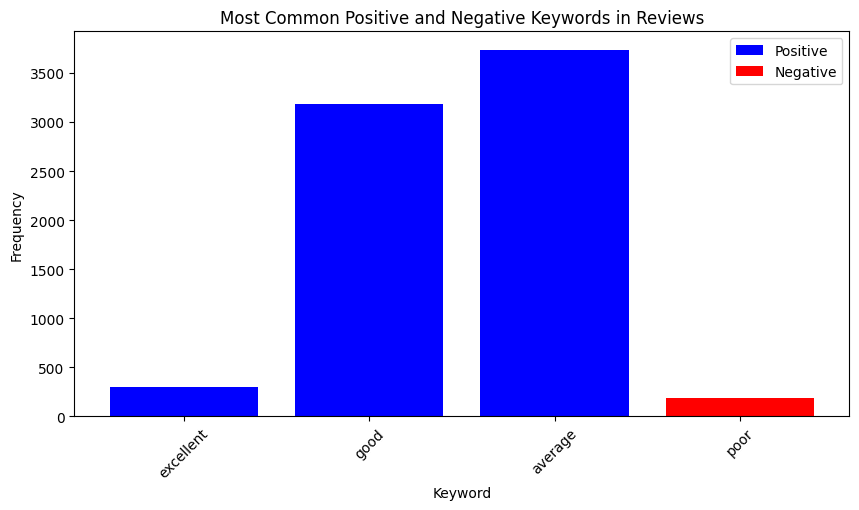

In [14]:
positive_words = ['average', 'excellent', 'good', 'very good']
negative_words = ['poor', 'not rated']

stop_words = set(stopwords.words('english'))
all_reviews = ' '.join(ds['Rating text'])
all_words = word_tokenize(all_reviews.lower())
filtered_words = [word for word in all_words if word.isalpha() and word not in stop_words]

positive_counts = Counter([word for word in filtered_words if word in positive_words])
negative_counts = Counter([word for word in filtered_words if word in negative_words])

plt.figure(figsize=(10, 5))
plt.bar(positive_counts.keys(), positive_counts.values(), color='blue', label='Positive')
plt.bar(negative_counts.keys(), negative_counts.values(), color='red', label='Negative')
plt.xlabel('Keyword')
plt.ylabel('Frequency')
plt.title('Most Common Positive and Negative Keywords in Reviews')
plt.legend()
plt.xticks(rotation=45)
plt.show()

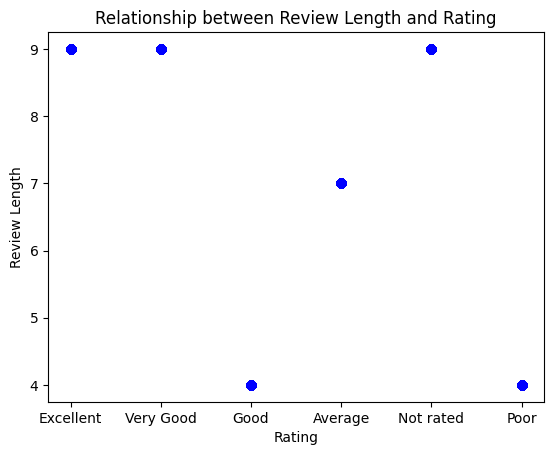

Average Review Length: 7.020730813527379


In [15]:
ds['Review Length'] = ds['Rating text'].str.len()
average_review_length = ds['Review Length'].mean()

plt.scatter(ds['Rating text'], ds['Review Length'], color='blue')
plt.xlabel('Rating')
plt.ylabel('Review Length')
plt.title('Relationship between Review Length and Rating')
plt.show()

print(f'Average Review Length: {average_review_length}')

## Task 2: Votes Analysis

In [16]:
# Find all restaurants with the lowest number of votes

lowest_votes = ds['Votes'].min()
lowest_voted_restaurants = ds[ds['Votes'] == lowest_votes]

print("Restaurants with the lowest number of votes:")
print(lowest_voted_restaurants[['Restaurant Name', 'Votes']])

Restaurants with the lowest number of votes:
                 Restaurant Name  Votes
69              Cantinho da Gula      0
874                The Chaiwalas      0
879           Fusion Food Corner      0
880                Punjabi Rasoi      0
887                Baskin Robbin      0
...                          ...    ...
9044               6 Packs Momos      0
9098                   Cafe' Wow      0
9099  Chef's Basket Pop Up Caf��      0
9103            The Hangout-Deli      0
9111                    Platters      0

[1094 rows x 2 columns]


In [17]:
# Find all restaurants with the highest number of votes

highest_votes = ds['Votes'].max()
highest_voted_restaurants = ds[ds['Votes'] == highest_votes]

print("Restaurants with the highest number of votes:")
print(highest_voted_restaurants[['Restaurant Name', 'Votes']])

Restaurants with the highest number of votes:
    Restaurant Name  Votes
728            Toit  10934


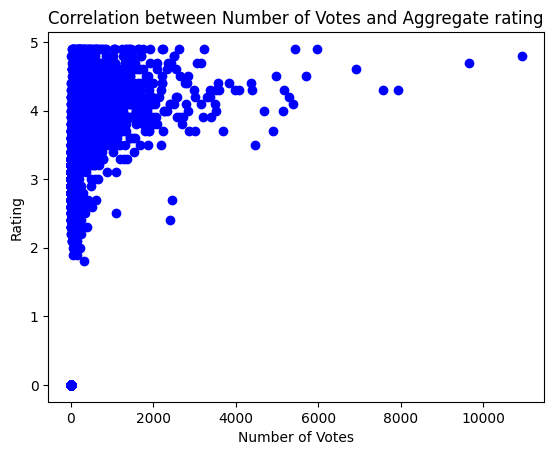

In [18]:
plt.scatter(ds['Votes'], ds['Aggregate rating'], color='blue')
plt.xlabel('Number of Votes')
plt.ylabel('Rating')
plt.title('Correlation between Number of Votes and Aggregate rating')
plt.show()

## Task 3: Price Range vs. Online Delivery and Table Bookingg

   Has Online delivery  Has Table booking
0                    0                  1
1                    0                  1
2                    0                  1
3                    0                  0
4                    0                  1


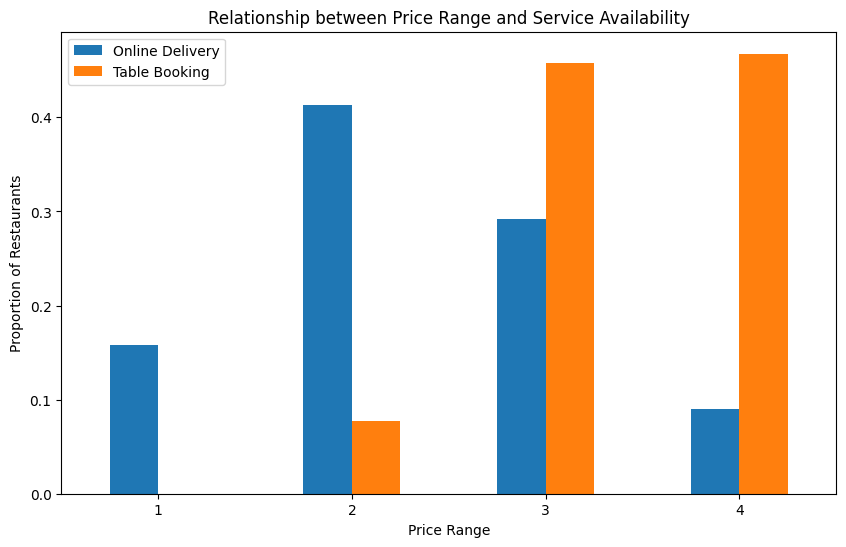

In [19]:
ds['Has Online delivery']=le.fit_transform(ds['Has Online delivery'])
ds['Has Table booking']=le.fit_transform(ds['Has Table booking'])

print(ds[['Has Online delivery', 'Has Table booking']].head())
price_vs_services = ds.groupby('Price range')[['Has Online delivery', 'Has Table booking']].mean()
price_vs_services.plot(kind='bar', figsize=(10, 6))
plt.title('Relationship between Price Range and Service Availability')
plt.xlabel('Price Range')
plt.ylabel('Proportion of Restaurants')
plt.xticks(rotation=0)
plt.legend(['Online Delivery', 'Table Booking'])
plt.show()

# The all the level of all task has been implemented using python language

#                                                                          Thank you 